In [1]:
import tarfile
from pathlib import Path

if Path("data").exists() == False:
    tar = tarfile.open("dentalData.tar")
    tar.extractall("data")
    tar.close()

# Dependencies

In [2]:
from torch.utils.data import Dataset
from pathlib import Path
from PIL import Image, ImageDraw
import numpy as np
import json


class DentalDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        super().__init__()

        self.data_dir = Path(data_dir)

        self.all_img_paths = list(data_dir.glob("test/img/*"))
        # self.all_mask_paths = list(data_dir.glob("train/ann/*"))
        self.transform = transform

    def __len__(self):
        return len(self.all_img_paths)


    def __getitem__(self, index):

        img_pth = self.all_img_paths[index]
        image = Image.open(img_pth)
        img_array = np.array(image)

        mask_path = self.data_dir / Path("test/ann") / Path(f"{img_pth.name}.json")

        with open(mask_path, 'rb') as file:
            masks = json.load(file)
            masks = masks["objects"]

        raw_mask = Image.new('L', img_array.shape[:-1][::-1], 0)

        for tooth in masks:
            pts = tooth["points"]["exterior"]
            ImageDraw.Draw(raw_mask).polygon(pts, outline=1, fill=1)

        if self.transform != None:

            img_array, raw_mask = self.transform(img_array, raw_mask)

        return (img_array, raw_mask)


In [3]:
import torch
from torch import nn
import torchvision

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

        )

    def forward(self, x : torch.Tensor):
        return self.conv(x)


class UNET(nn.Module):

    def __init__(self, in_channels=3, out_channels=1, features=[64, 128, 256, 512]):
        super().__init__()

        self.downs = nn.ModuleList()
        self.ups = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=(2, 2), stride=2)

        for feature in features:
            self.downs.append(
                DoubleConv(in_channels, feature)
            )
            in_channels = feature

        for feature in reversed(features):
            self.ups.append(
                    nn.ConvTranspose2d(feature*2, feature, kernel_size=2, stride=2)
                    )
            self.ups.append(DoubleConv(in_channels=feature*2, out_channels=feature))

        self.bottleneck = DoubleConv(features[-1], out_channels=features[-1]*2)

        self.final_conv = nn.Conv2d(features[0], out_channels=out_channels, kernel_size=3, padding=1, stride=1)


    def forward(self, x : torch.Tensor):
        skip_connections : list[torch.Tensor] = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)

        skip_connections = skip_connections[::-1]


        for i in range(0, len(self.ups), 2):
            x = self.ups[i](x)

            if x.shape != skip_connections[i//2].shape:
                x = torchvision.transforms.Resize(skip_connections[i//2].shape[2:])(x)

            concat_skip = torch.cat([x, skip_connections[i//2]], dim=1)
            x = self.ups[i+1](concat_skip)

        return self.final_conv(x)

In [4]:
from torchvision.transforms import v2

def train_transforms(img, mask):

    def get_random():
        return torch.rand(1).item()

    img = v2.ToImage()(img)
    mask = v2.ToImage()(mask)

    img = v2.Resize((160, 240))(img)
    mask = v2.Resize((160, 240))(mask)

    if get_random() > 0.5:
        img = v2.RandomHorizontalFlip(p=1)(img)
        mask = v2.RandomHorizontalFlip(p=1)(mask)

    if get_random() > 0.5:
        img = v2.RandomVerticalFlip(p=1)(img)
        mask = v2.RandomVerticalFlip(p=1)(mask)

    img = v2.ToDtype(torch.float32, scale=True)(img)
    mask = v2.ToDtype(torch.float32, scale=True)(mask)

    return (img, mask)

test_data = DentalDataset(data_dir=Path('data'), transform=train_transforms)

# Inference on Test Data

Ineference Time :  0.21021979999977702


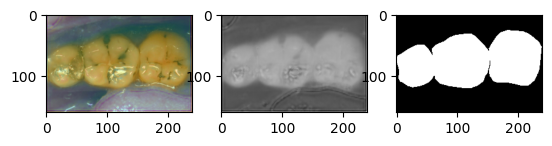

Ineference Time :  0.16906079999989743


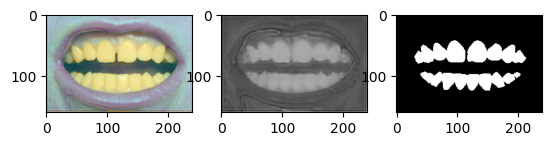

Ineference Time :  0.19327599999996892


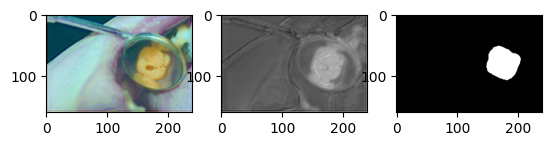

Ineference Time :  0.16816520000020319


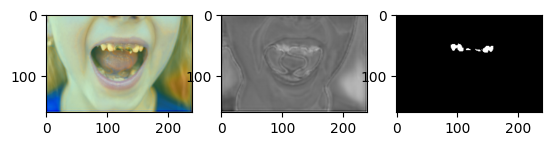

Ineference Time :  0.17704879999973855


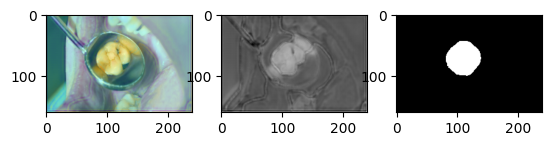

Ineference Time :  0.1847709999997278


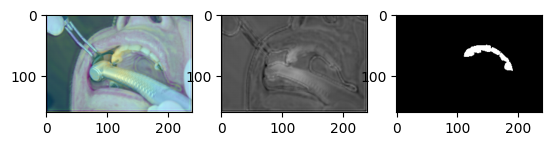

Ineference Time :  0.19826579999971727


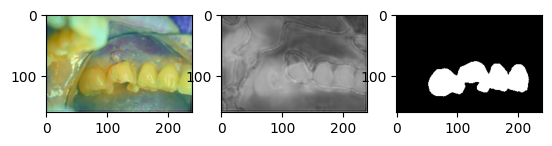

Ineference Time :  0.16830739999977595


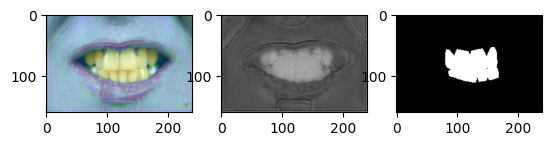

Ineference Time :  0.16671360000009372


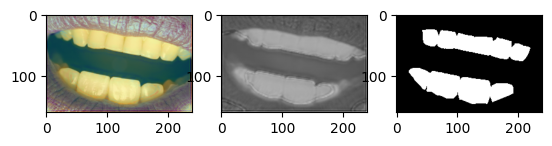

Ineference Time :  0.1747987999997349


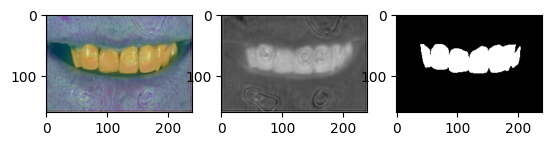

Ineference Time :  0.16953319999993255


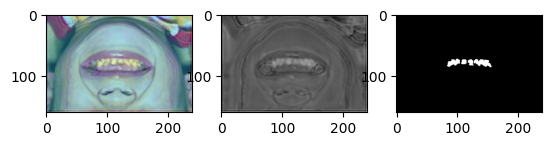

Ineference Time :  0.18618580000020302


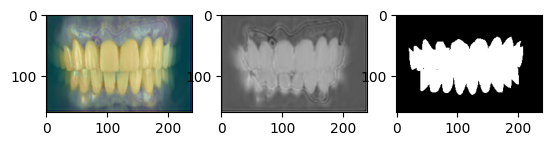

Ineference Time :  0.16916970000011133


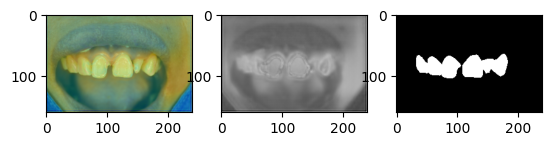

Ineference Time :  0.1767159000000902


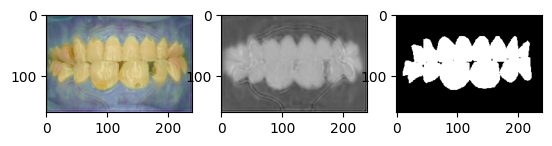

Ineference Time :  0.16659570000001622


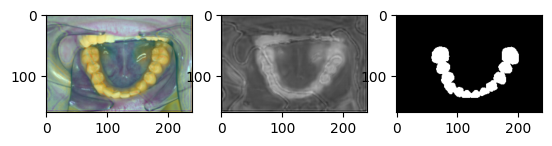

Ineference Time :  0.1837345999997524


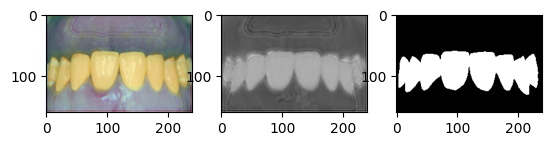

Ineference Time :  0.1730504000001929


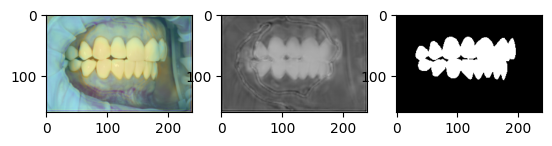

Ineference Time :  0.17192840000006981


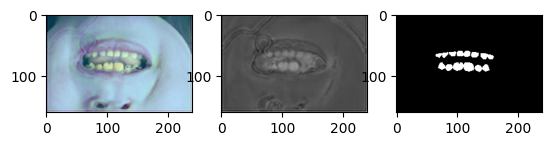

Ineference Time :  0.1734468999998171


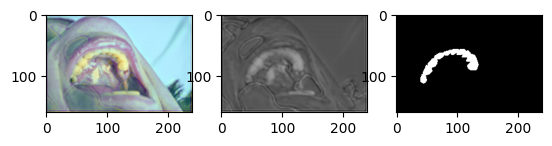

Ineference Time :  0.17587249999996857


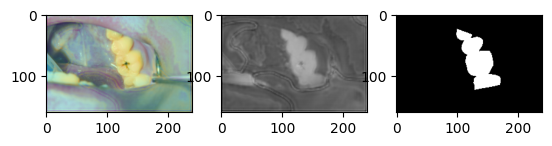

Ineference Time :  0.17065309999998135


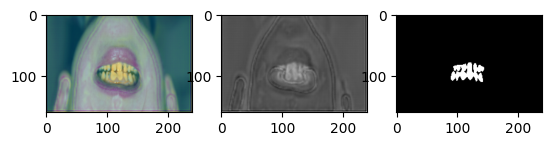

Ineference Time :  0.17287469999973837


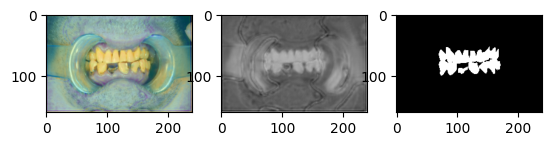

Ineference Time :  0.1828918999999587


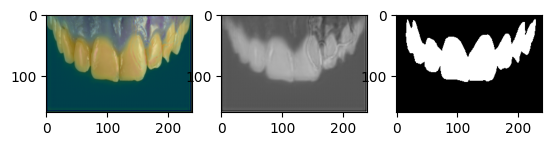

Ineference Time :  0.173894399999881


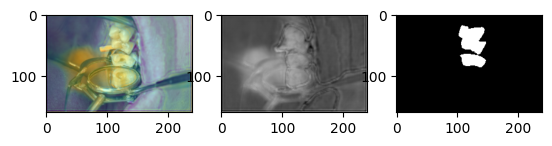

Ineference Time :  0.1711569999997664


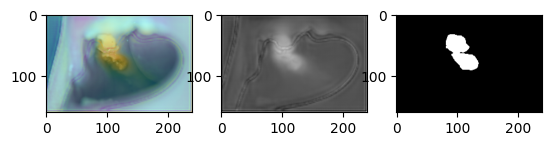

Ineference Time :  0.19509440000001632


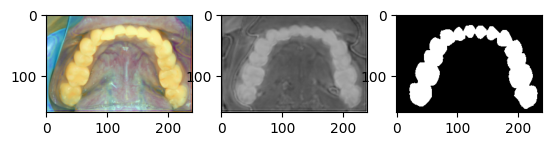

Ineference Time :  0.17465600000014092


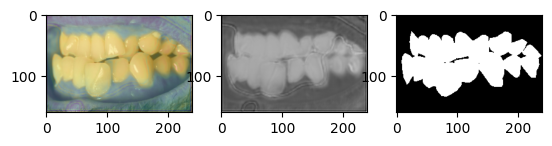

Ineference Time :  0.2106856999998854


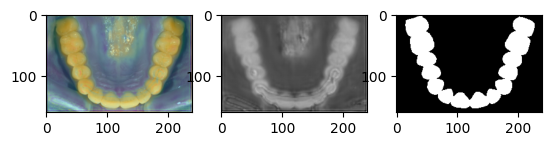

Ineference Time :  0.21366420000003927


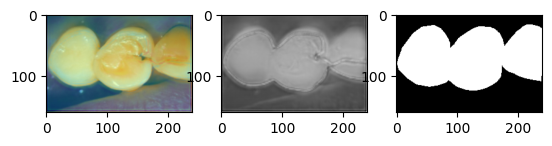

Ineference Time :  0.1710889999999381


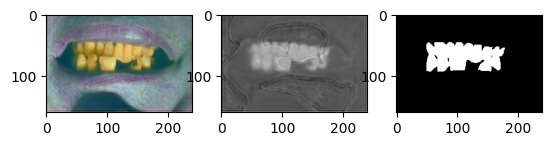

Ineference Time :  0.17340729999978066


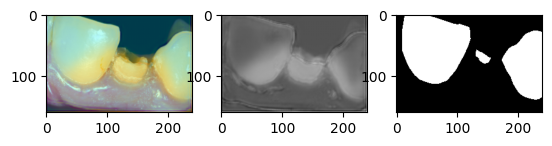

Ineference Time :  0.1856038000000808


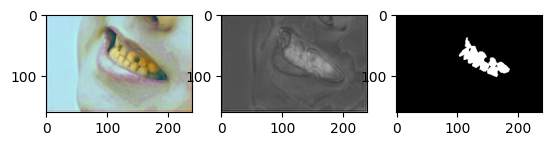

Ineference Time :  0.1778097000001253


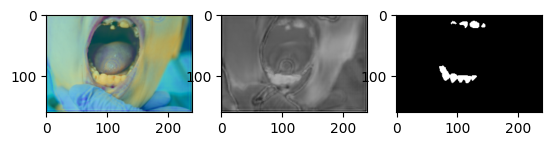

Ineference Time :  0.17367049999984374


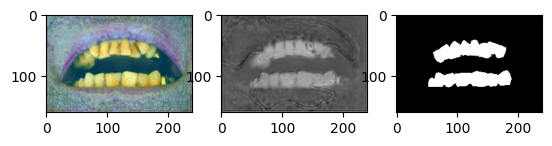

Ineference Time :  0.1971269000000575


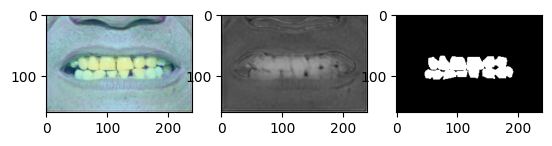

Ineference Time :  0.20167369999990115


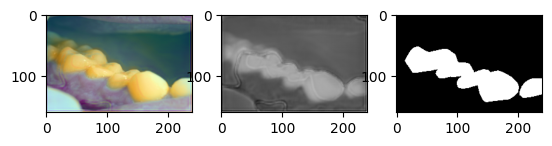

Ineference Time :  0.1779252000001179


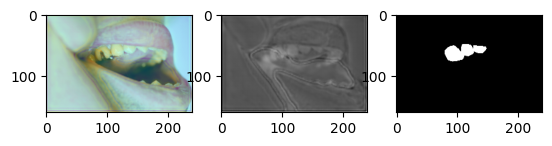

Ineference Time :  0.1745943000000807


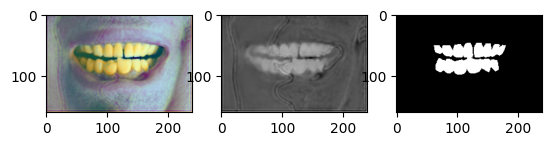

Ineference Time :  0.17410860000018147


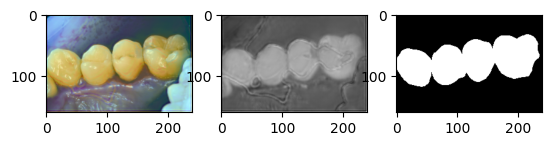

Ineference Time :  0.1838207999999213


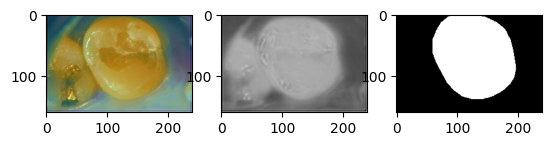

Ineference Time :  0.19045839999989767


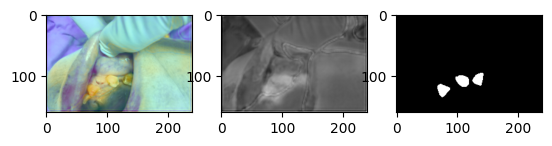

Ineference Time :  0.1972422000003462


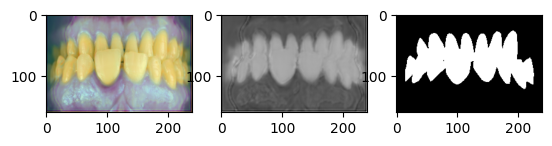

Ineference Time :  0.17052130000001853


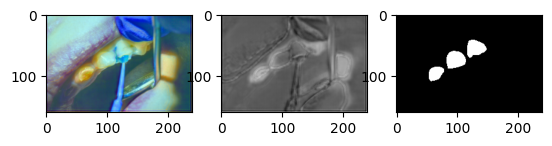

Ineference Time :  0.17899599999964266


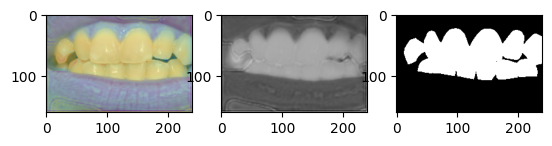

Ineference Time :  0.1693328000001202


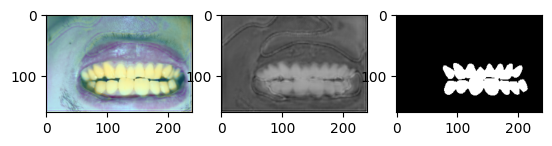

Ineference Time :  0.18544999999994616


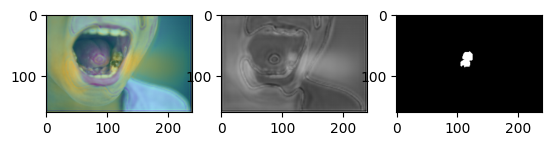

Ineference Time :  0.16479690000005576


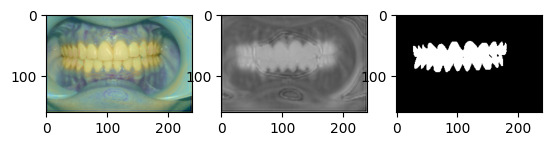

Ineference Time :  0.16492699999980687


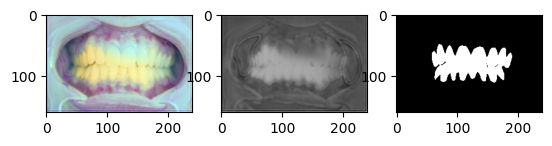

Ineference Time :  0.1627505999999812


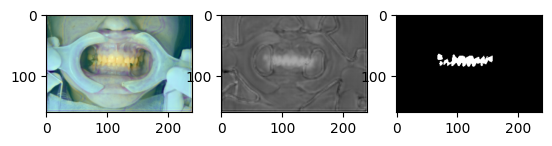

Ineference Time :  0.20476870000038616


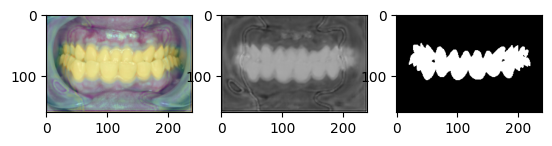

Ineference Time :  0.16631740000002537


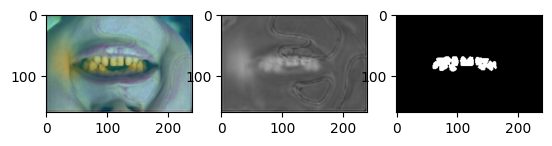

Ineference Time :  0.1821167000002788


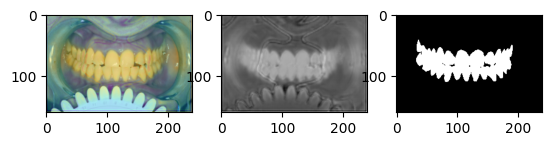

Ineference Time :  0.1682347999999365


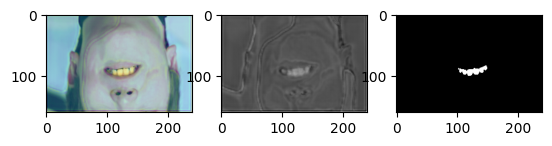

Ineference Time :  0.17394289999992907


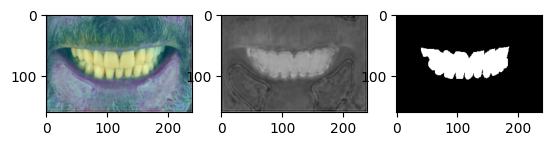

Ineference Time :  0.17380890000004


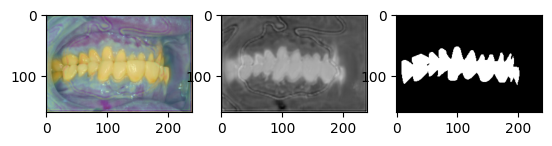

Ineference Time :  0.1703201000000263


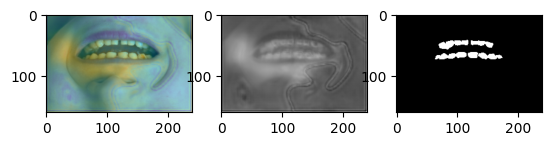

Ineference Time :  0.1928207000000839


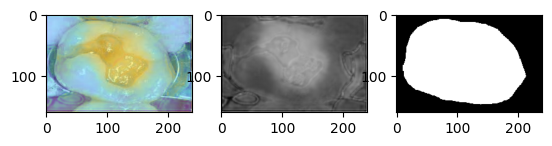

Ineference Time :  0.171593799999755


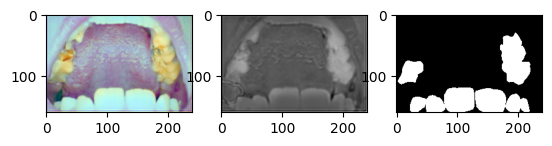

Ineference Time :  0.20641530000011699


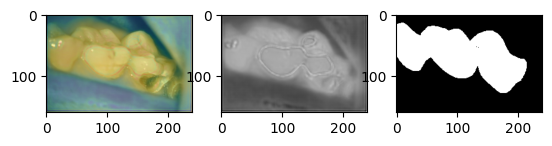

Ineference Time :  0.1755754999999226


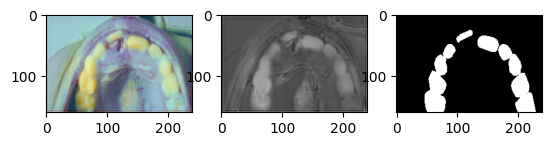

Ineference Time :  0.16976999999997133


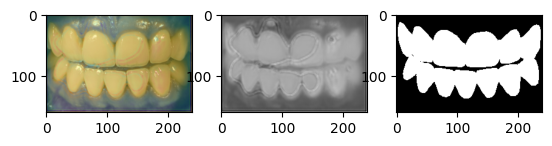

Ineference Time :  0.20442470000034518


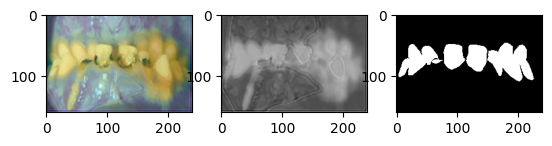

Ineference Time :  0.19820250000020678


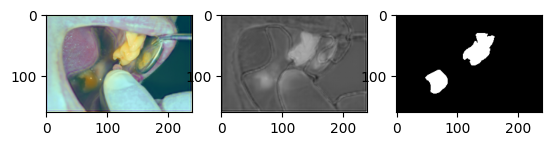

Ineference Time :  0.16614079999999376


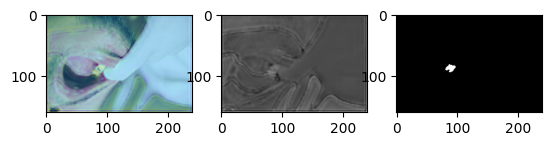

Ineference Time :  0.1664543000001686


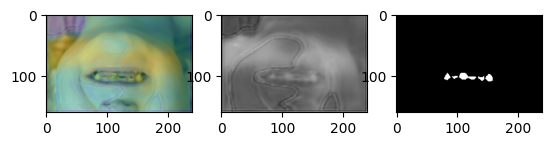

Ineference Time :  0.1725400999998783


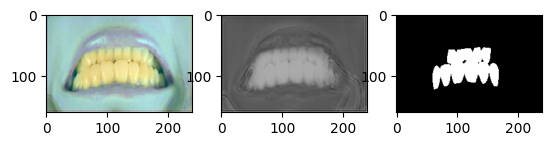

Ineference Time :  0.16898959999980434


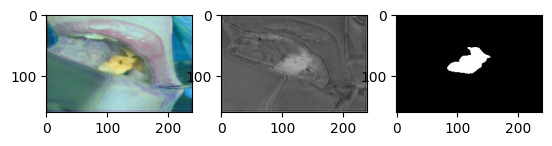

Ineference Time :  0.1666520000003402


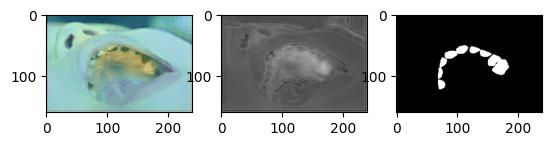

Ineference Time :  0.16564310000012483


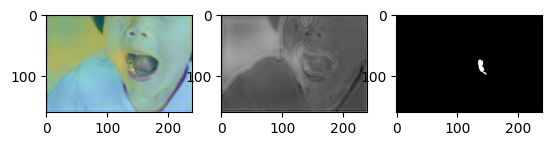

Ineference Time :  0.16852010000002338


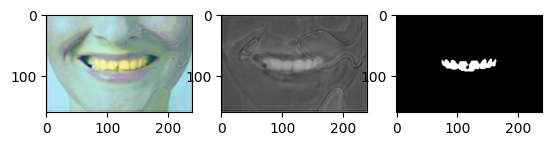

Ineference Time :  0.17881470000020272


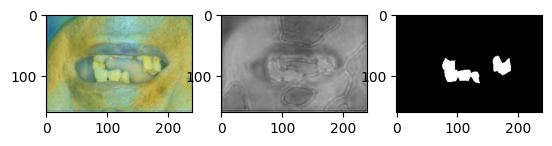

Ineference Time :  0.17287179999993896


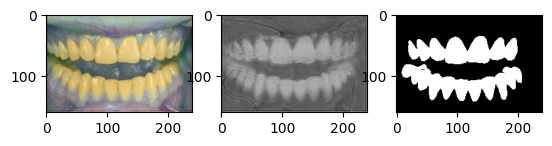

Ineference Time :  0.16916449999962424


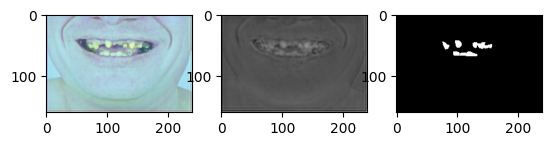

Ineference Time :  0.17025479999983872


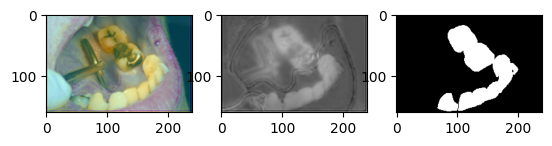

Ineference Time :  0.1686637999996492


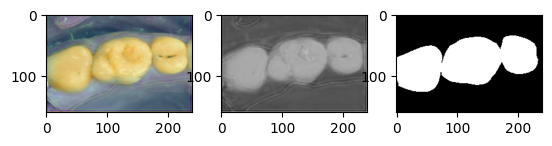

Ineference Time :  0.18107060000011188


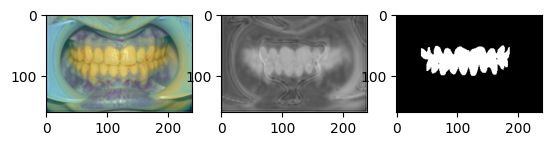

Ineference Time :  0.16654479999988325


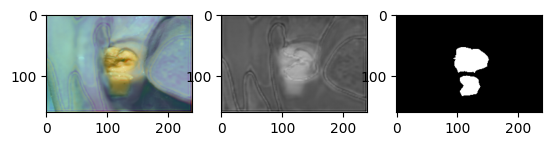

Ineference Time :  0.199808800000028


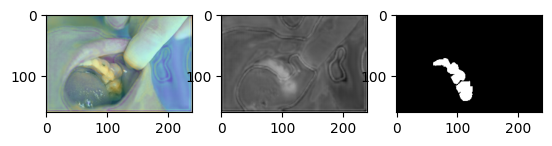

Ineference Time :  0.18169829999987996


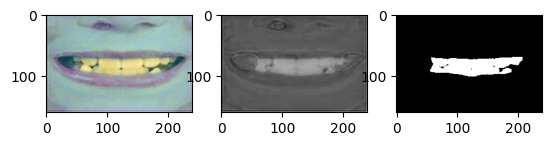

Ineference Time :  0.18096990000003643


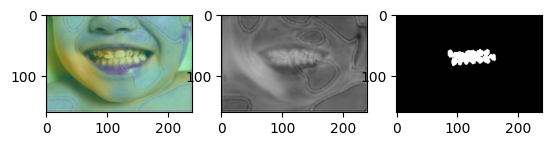

Ineference Time :  0.20614990000012767


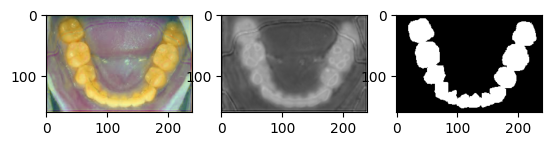

Ineference Time :  0.19082200000002558


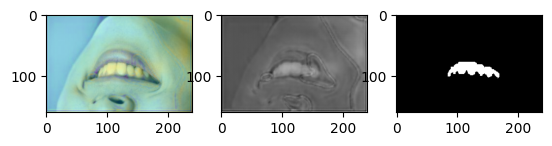

Ineference Time :  0.1789853000000221


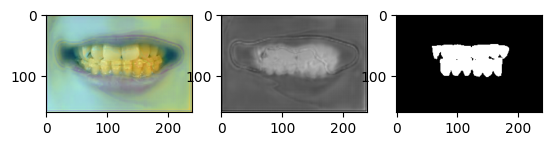

Ineference Time :  0.1788896000002751


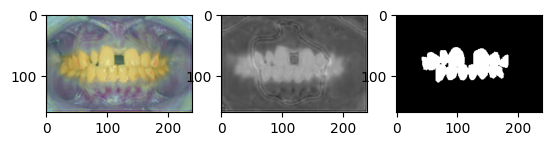

Ineference Time :  0.18587600000000748


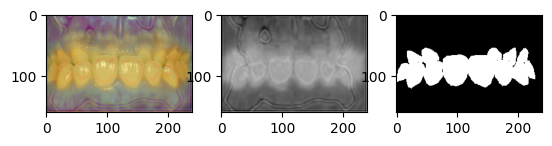

Ineference Time :  0.2093912000000273


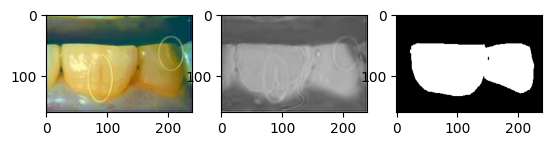

Ineference Time :  0.18132500000001528


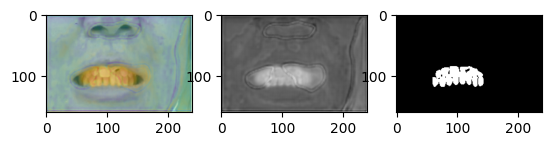

Ineference Time :  0.180904300000293


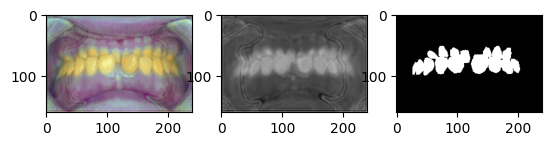

Ineference Time :  0.18536960000028557


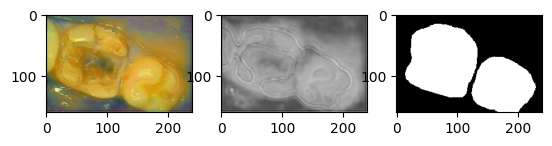

Ineference Time :  0.1938043000000107


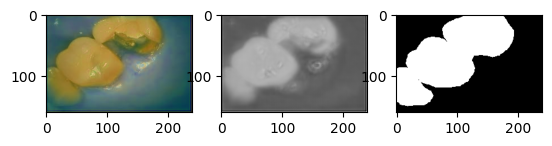

Ineference Time :  0.18498760000011316


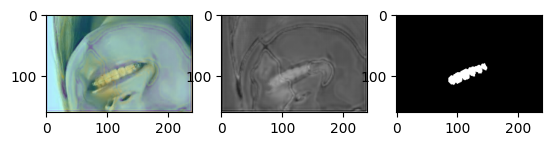

Ineference Time :  0.20743170000014288


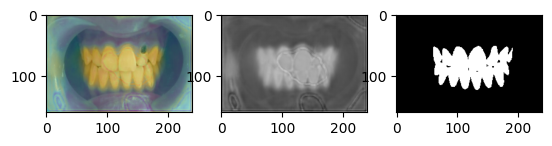

Ineference Time :  0.17039660000000367


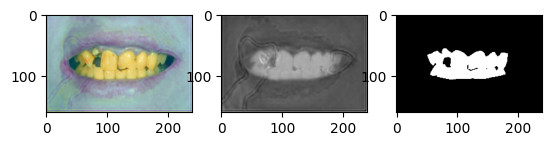

Ineference Time :  0.1751859000000877


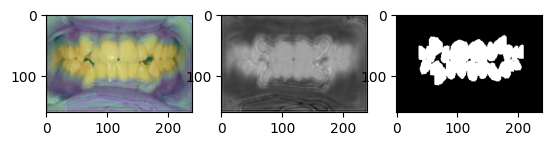

Ineference Time :  0.18053620000000592


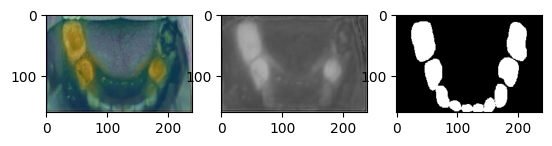

Ineference Time :  0.18812350000007427


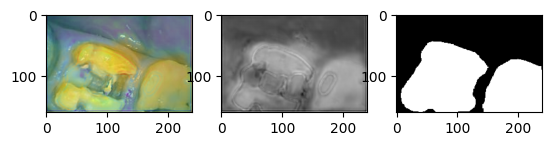

Ineference Time :  0.202320299999883


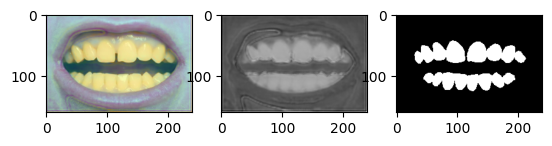

Ineference Time :  0.18143079999981637


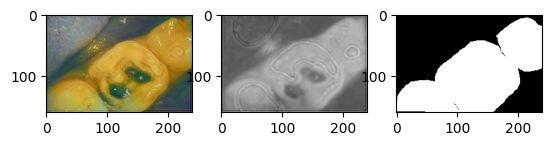

Ineference Time :  0.1947533000002295


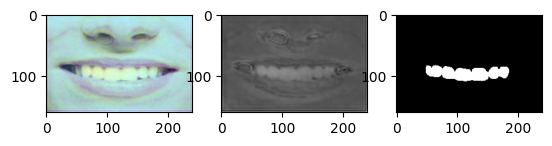

Ineference Time :  0.1794942000001356


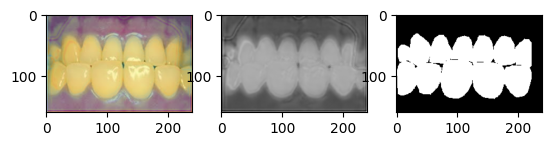

Ineference Time :  0.19467560000020967


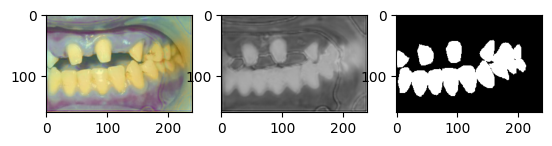

Ineference Time :  0.18816449999985707


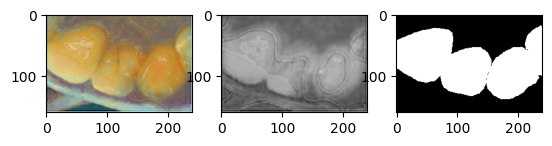

Ineference Time :  0.18853889999991225


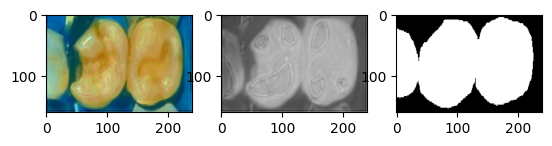

Ineference Time :  0.1976980999997977


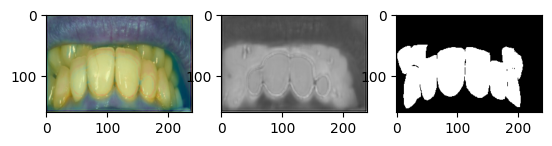

Ineference Time :  0.17760219999991023


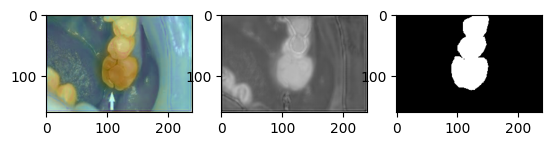

Ineference Time :  0.1805076000000554


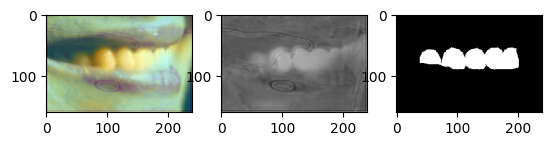

Ineference Time :  0.16735700000026554


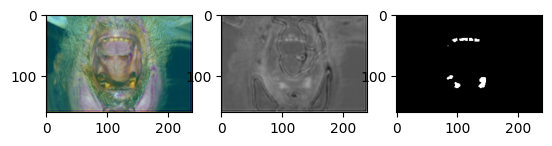

Ineference Time :  0.17942420000008497


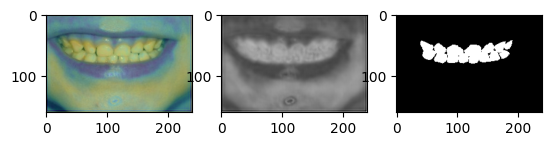

Ineference Time :  0.18290509999997084


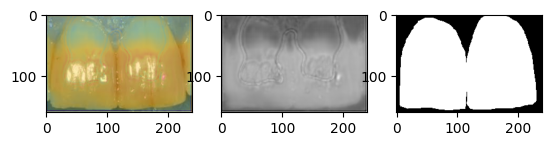

Ineference Time :  0.1905439000001934


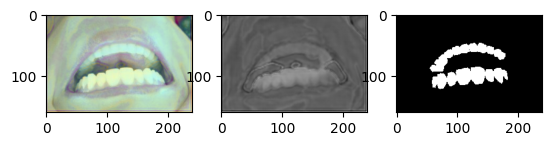

Ineference Time :  0.1630608000000393


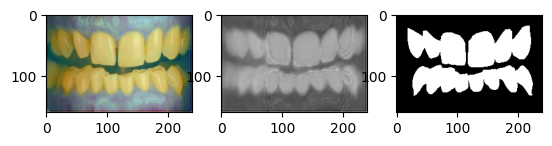

Ineference Time :  0.17688129999987723


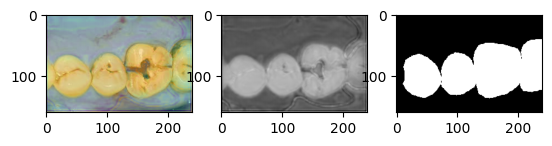

Ineference Time :  0.17958369999996648


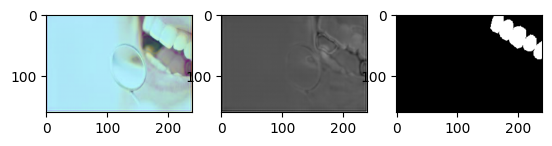

Ineference Time :  0.18241729999999734


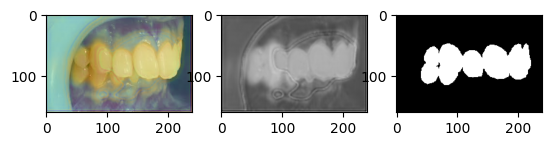

Ineference Time :  0.185291899999811


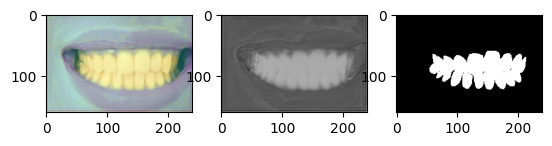

Ineference Time :  0.1814385000002403


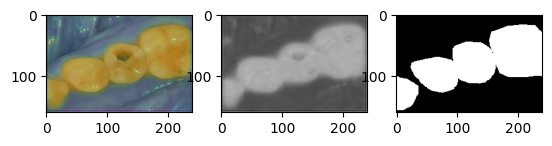

Ineference Time :  0.1749566000003142


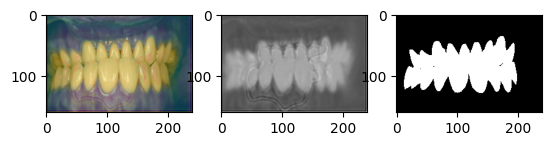

Ineference Time :  0.17964219999976194


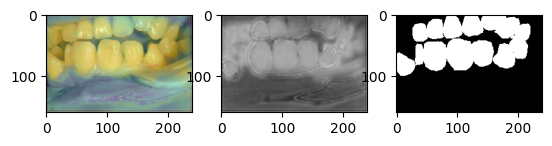

Ineference Time :  0.2009962999995878


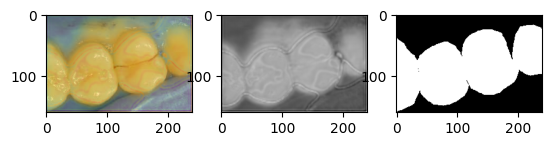

Ineference Time :  0.18515770000021803


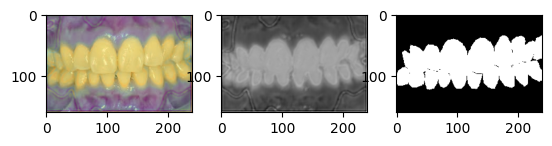

Ineference Time :  0.1840250999998716


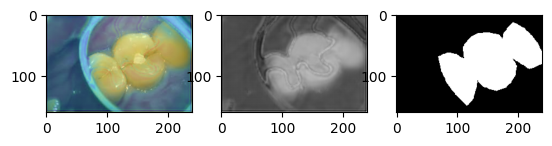

Ineference Time :  0.17889720000039233


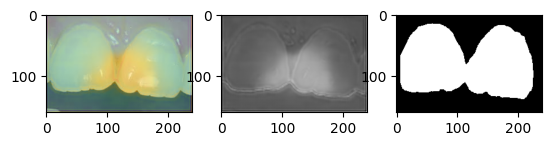

Ineference Time :  0.16496719999986453


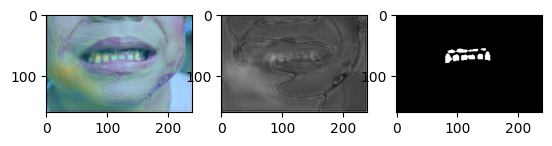

Ineference Time :  0.19028649999972913


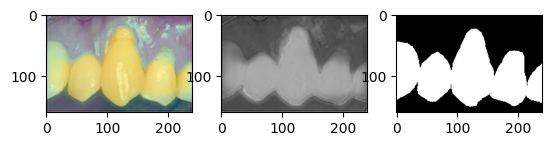

Ineference Time :  0.18261089999987234


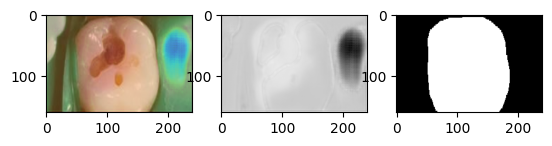

Ineference Time :  0.19116260000009788


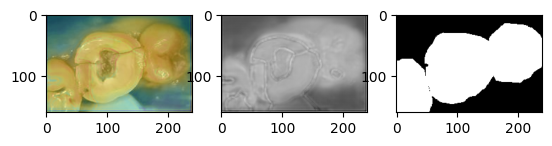

Ineference Time :  0.18733990000009726


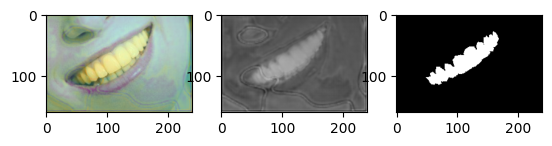

Ineference Time :  0.19030960000009145


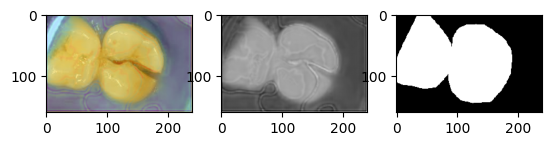

Ineference Time :  0.18836229999988063


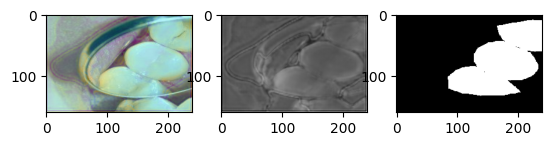

Ineference Time :  0.18050670000002356


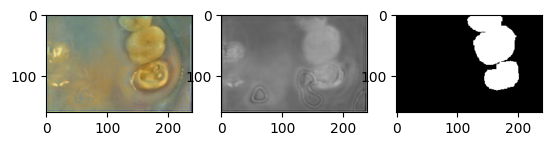

Ineference Time :  0.18272569999999178


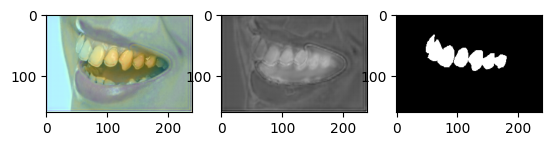

Ineference Time :  0.1745663000001514


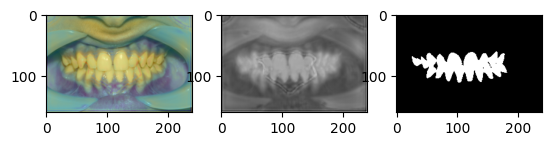

Ineference Time :  0.20097989999976562


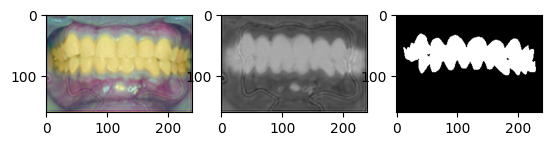

Ineference Time :  0.19472739999991973


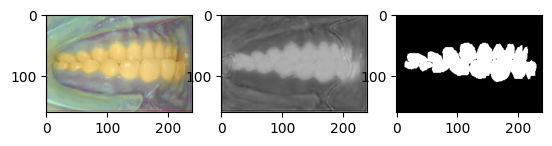

Ineference Time :  0.17866670000012164


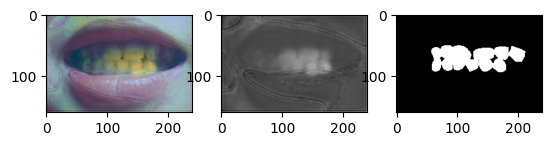

Ineference Time :  0.19081640000013067


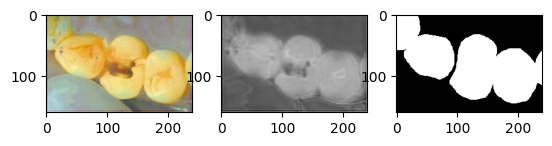

Ineference Time :  0.19164009999985865


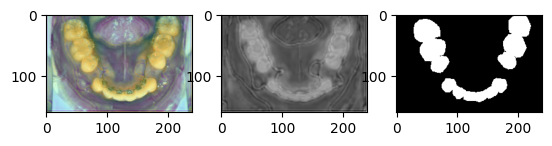

Ineference Time :  0.19720909999978176


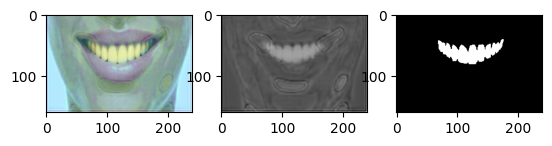

Ineference Time :  0.18042700000023615


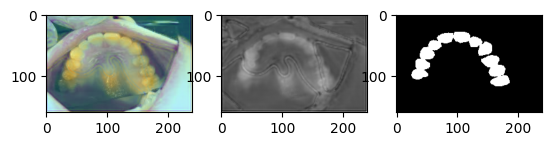

Ineference Time :  0.1863348000001679


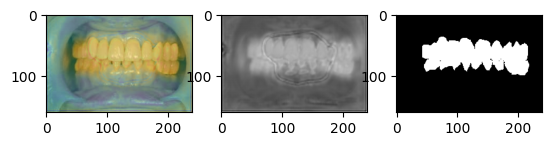

Ineference Time :  0.19277299999976094


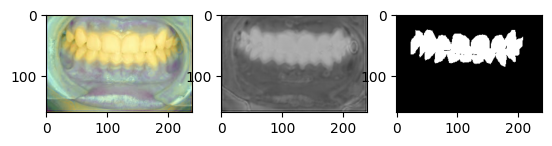

Ineference Time :  0.19154989999969985


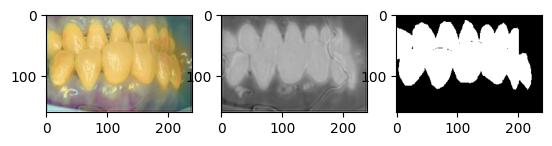

Ineference Time :  0.17151909999984127


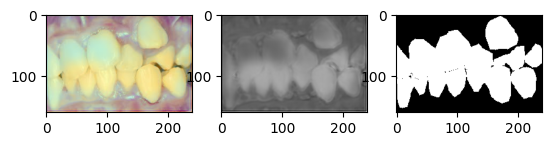

Ineference Time :  0.17325860000028115


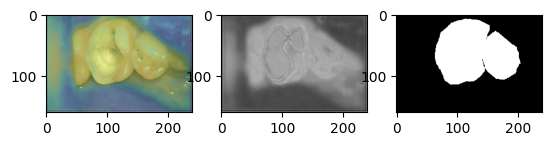

Ineference Time :  0.17886360000011337


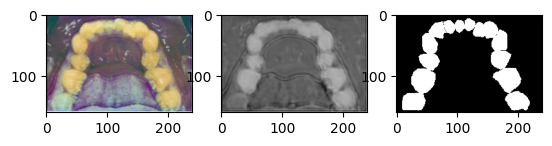

Ineference Time :  0.17975070000011328


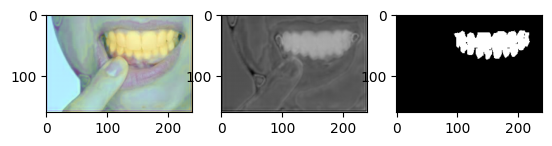

Ineference Time :  0.17342569999982516


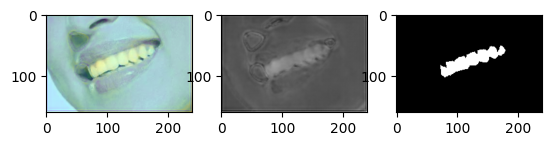

Ineference Time :  0.17445610000004308


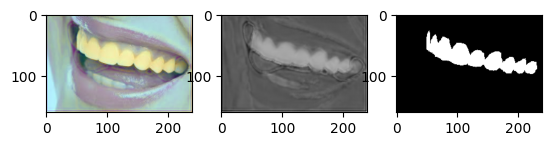

Ineference Time :  0.17780480000010357


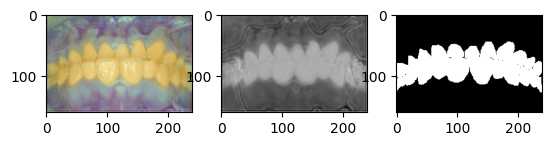

Ineference Time :  0.18147369999996954


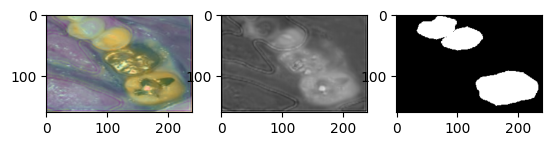

Ineference Time :  0.16676619999998366


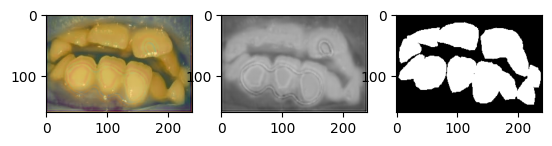

Ineference Time :  0.16812019999997574


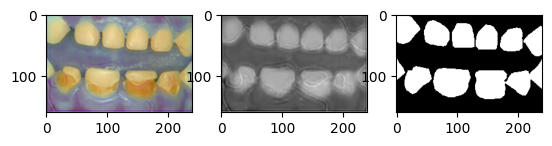

Ineference Time :  0.17528409999977157


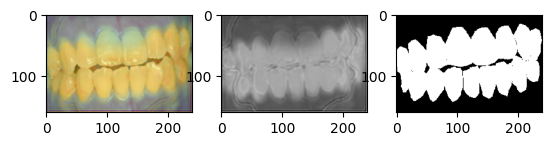

Ineference Time :  0.17406110000001718


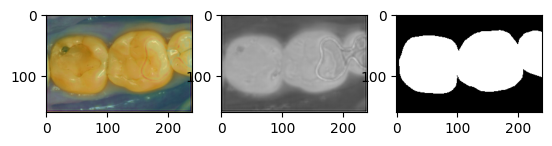

Ineference Time :  0.1734521999997014


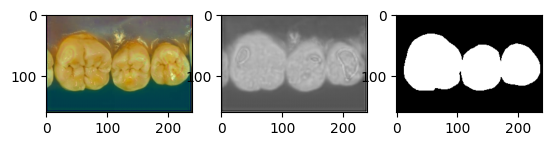

Ineference Time :  0.18619919999991907


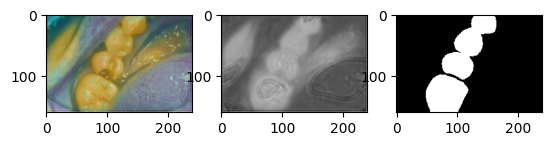

Ineference Time :  0.1738865999996051


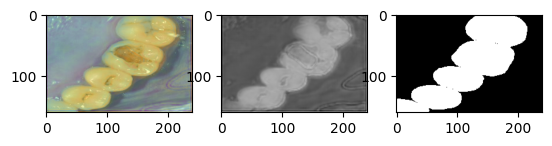

Ineference Time :  0.16206310000006852


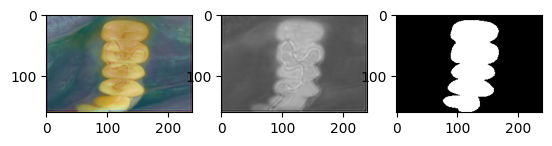

Ineference Time :  0.16937559999996665


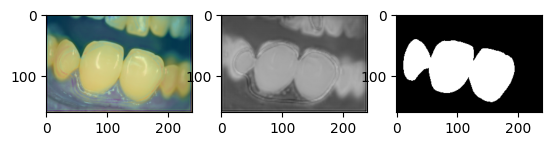

Ineference Time :  0.19392199999992954


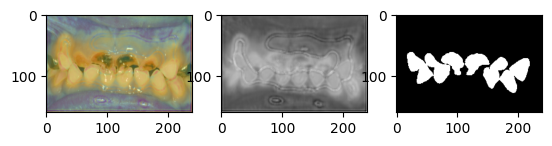

Ineference Time :  0.174229700000069


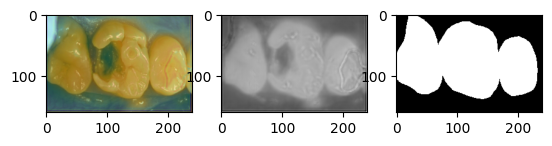

Ineference Time :  0.18373810000002777


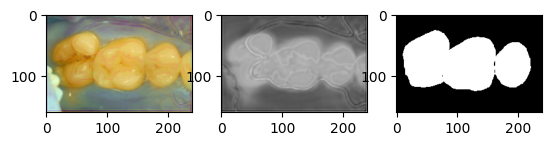

Ineference Time :  0.17761130000008052


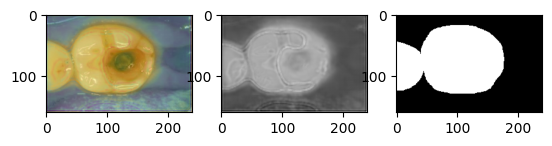

Ineference Time :  0.17517970000017158


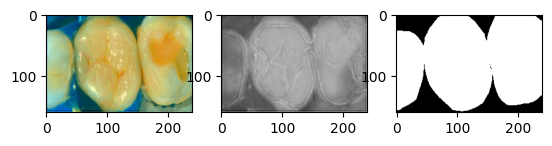

Ineference Time :  0.1801233000001048


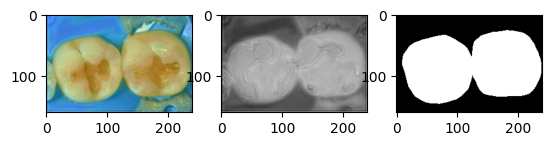

Ineference Time :  0.17708929999980683


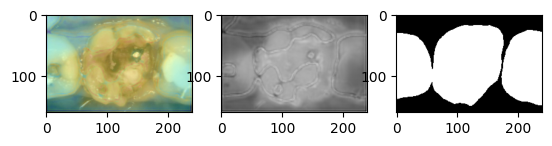

Ineference Time :  0.17834050000010393


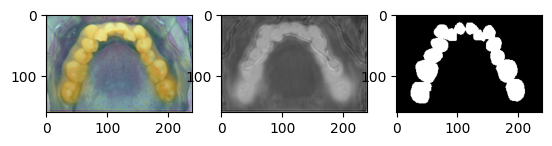

Ineference Time :  0.1958305000002838


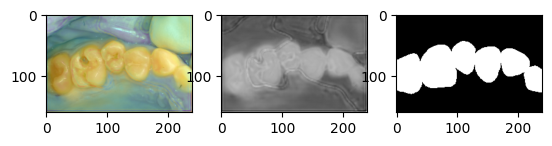

Ineference Time :  0.176209000000199


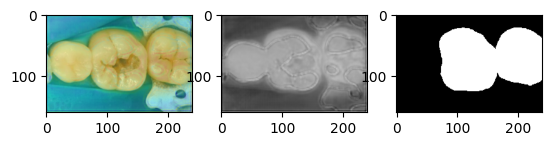

Ineference Time :  0.1742340000000695


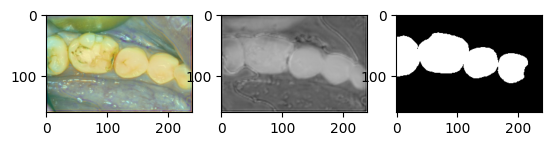

Ineference Time :  0.17694089999986318


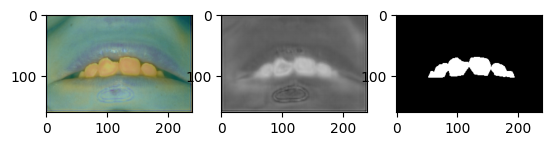

Ineference Time :  0.17752239999981612


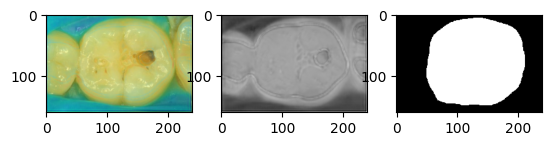

Ineference Time :  0.1756322999999611


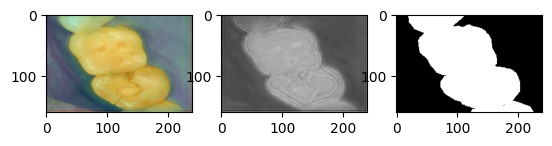

Ineference Time :  0.16368130000000747


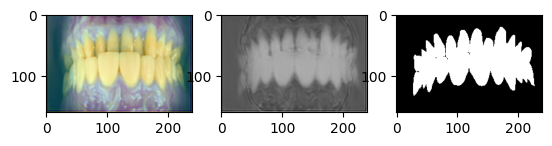

Ineference Time :  0.17694470000014917


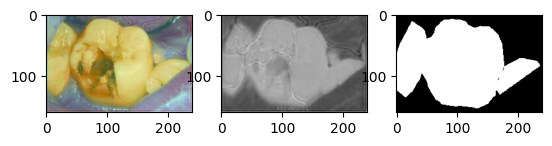

Ineference Time :  0.17722120000007635


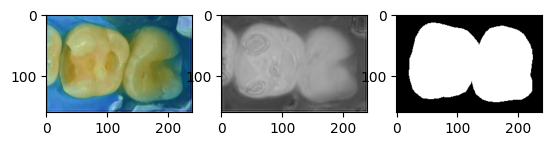

Ineference Time :  0.18084859999999026


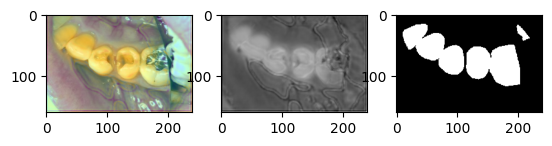

Ineference Time :  0.17488830000002054


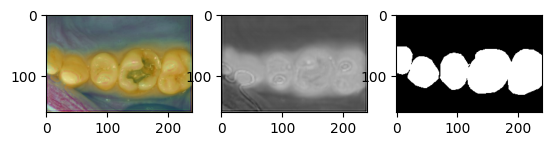

Ineference Time :  0.17655379999996512


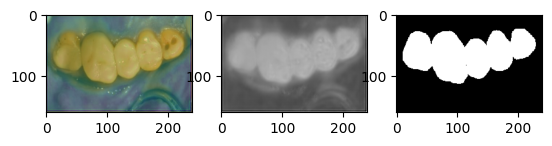

Ineference Time :  0.174758600000132


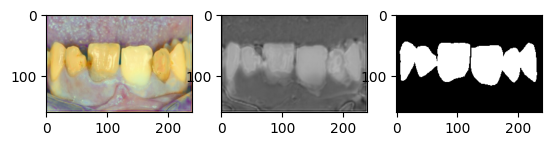

Ineference Time :  0.17540370000006078


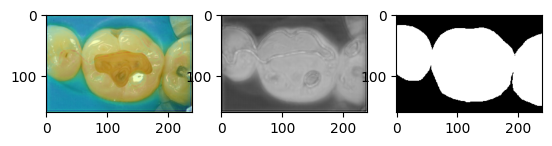

Ineference Time :  0.17437699999982215


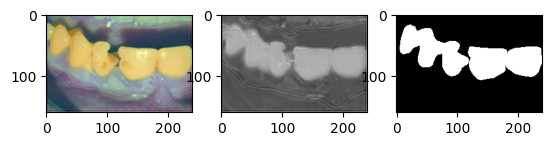

Ineference Time :  0.18737849999979517


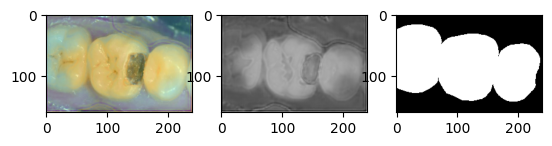

Ineference Time :  0.1798607999999149


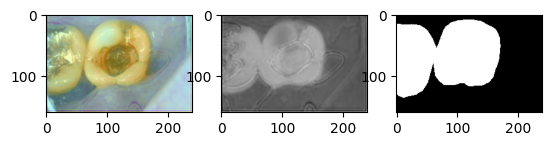

Ineference Time :  0.17771810000022015


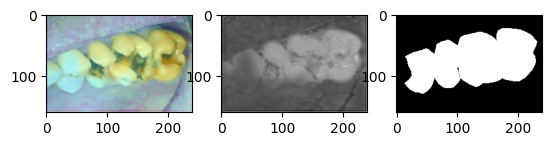

Ineference Time :  0.17883339999980308


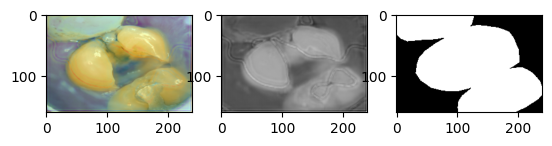

Ineference Time :  0.173323800000162


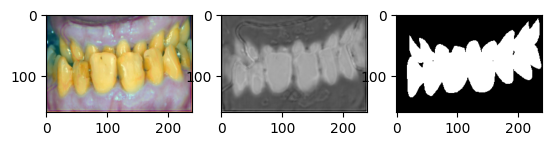

Ineference Time :  0.17372019999993427


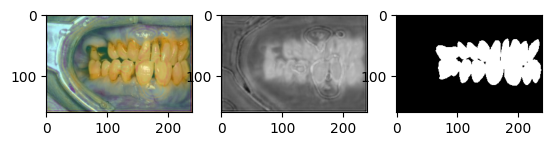

Ineference Time :  0.18282099999987622


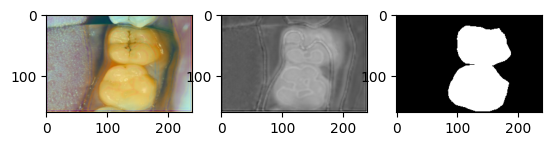

Ineference Time :  0.1723186999997779


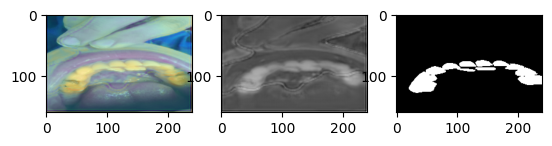

Ineference Time :  0.17002680000041437


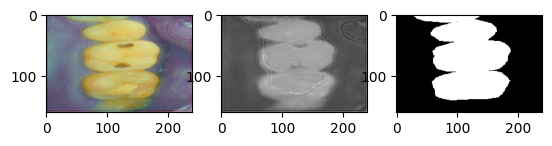

Ineference Time :  0.17933499999980995


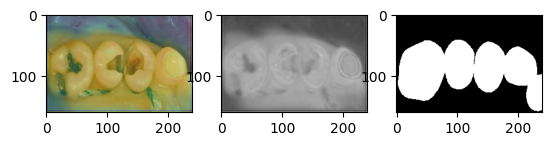

Ineference Time :  0.1824122000002717


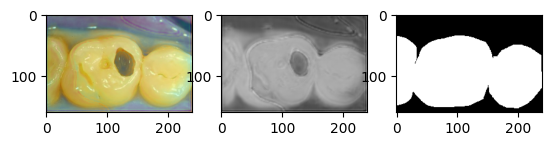

Ineference Time :  0.2110978000000614


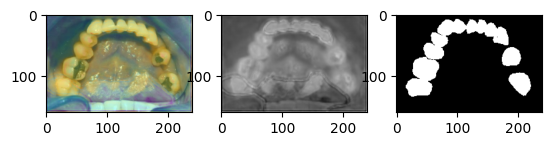

Ineference Time :  0.18248200000016368


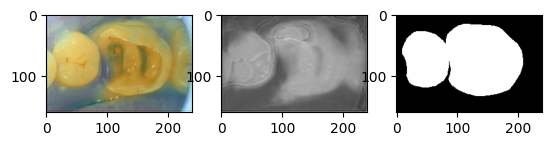

Ineference Time :  0.1807997000000796


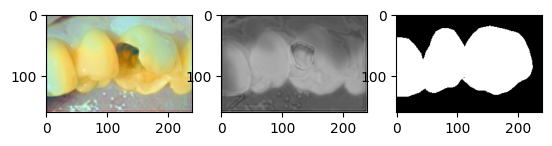

Ineference Time :  0.17485600000009072


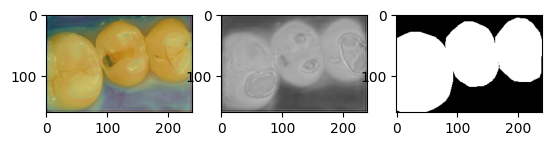

Ineference Time :  0.17405329999974128


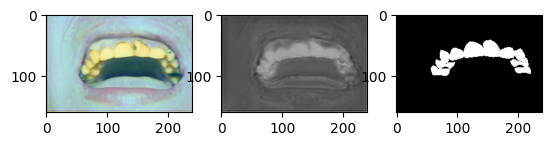

Ineference Time :  0.16484119999995528


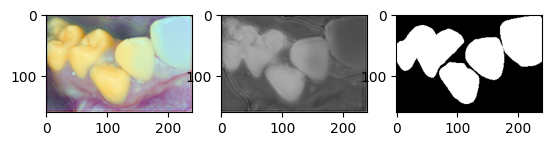

Ineference Time :  0.16315179999992324


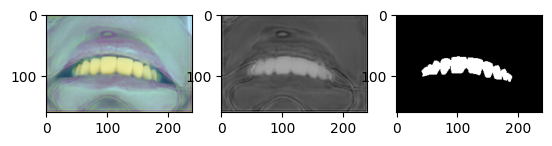

Ineference Time :  0.17656629999964935


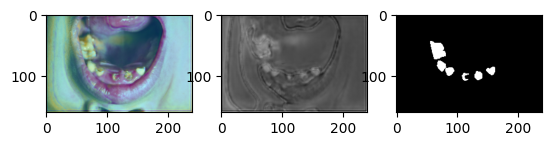

Ineference Time :  0.17810970000027737


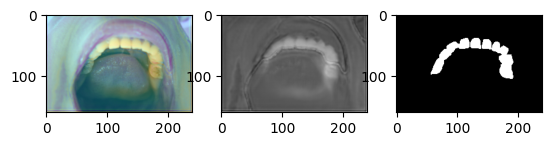

Ineference Time :  0.1725359999995817


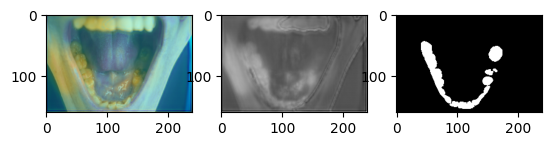

Ineference Time :  0.17099420000022292


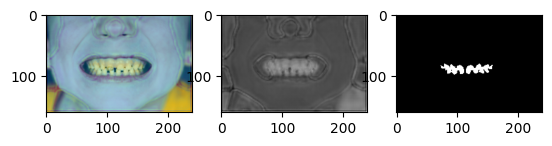

Ineference Time :  0.17236080000020593


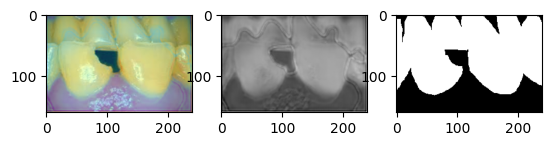

Ineference Time :  0.16203010000026552


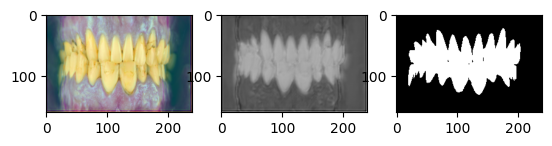

Ineference Time :  0.17581840000002558


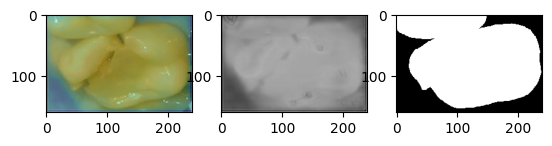

Ineference Time :  0.16885359999969296


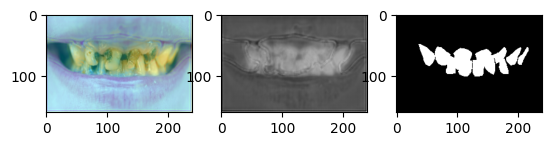

Ineference Time :  0.16496189999998023


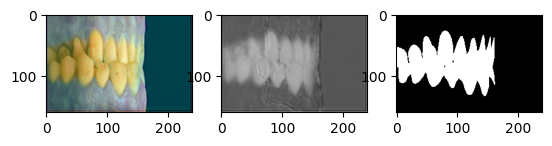

Ineference Time :  0.18625840000004246


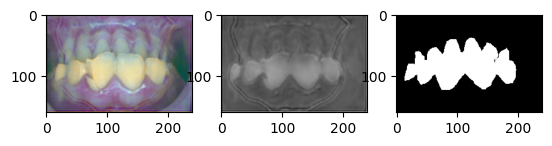

Ineference Time :  0.17334930000015447


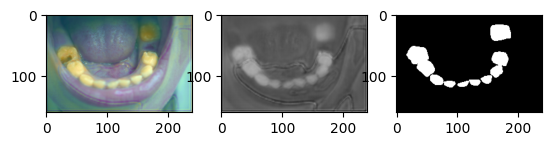

Ineference Time :  0.18129039999985253


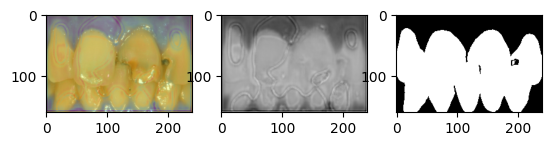

Ineference Time :  0.17217310000023645


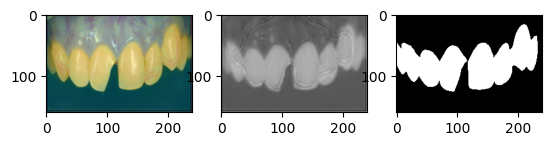

Ineference Time :  0.17263749999983702


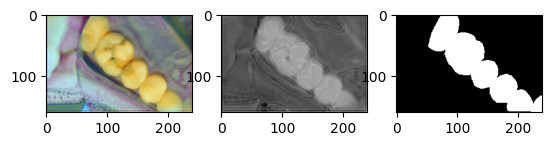

Ineference Time :  0.17564119999997274


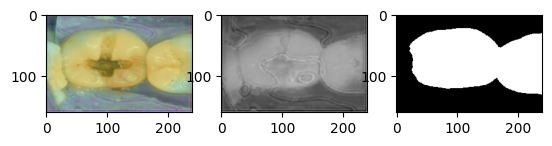

Ineference Time :  0.16057359999967957


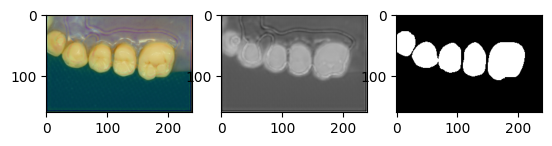

Ineference Time :  0.17532960000016828


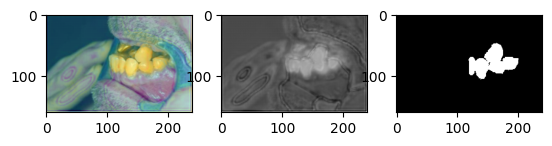

Ineference Time :  0.1675215999998727


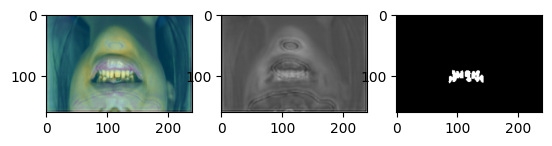

Ineference Time :  0.17169039999998859


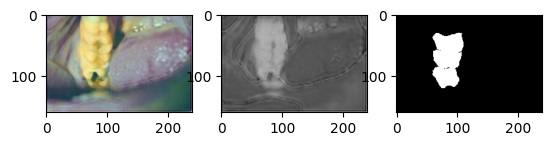

Ineference Time :  0.16794380000010278


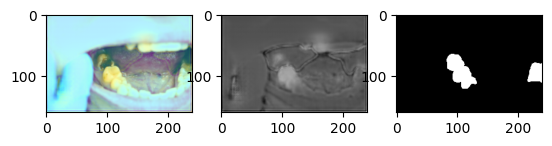

Ineference Time :  0.1632328000000598


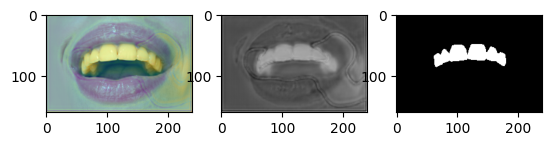

Ineference Time :  0.16835059999993973


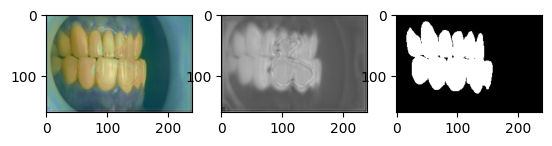

Ineference Time :  0.17067580000002636


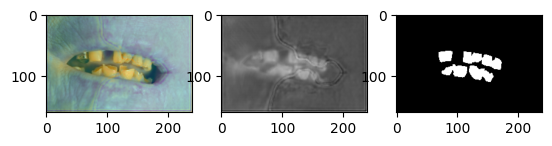

Ineference Time :  0.17602360000000772


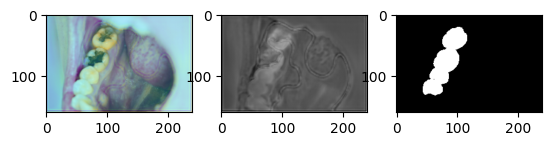

Ineference Time :  0.1650550999997904


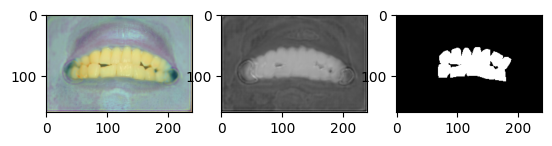

Ineference Time :  0.17070520000015676


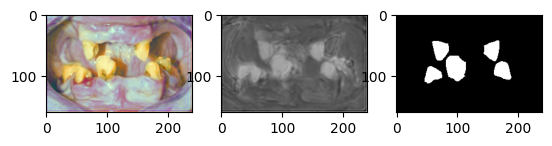

Ineference Time :  0.1781751000003169


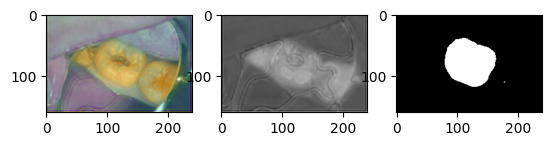

Ineference Time :  0.1811510000002272


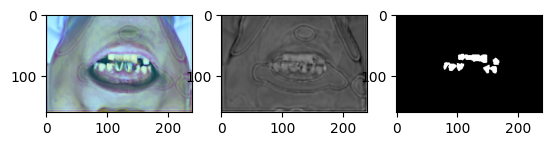

Ineference Time :  0.16263870000011593


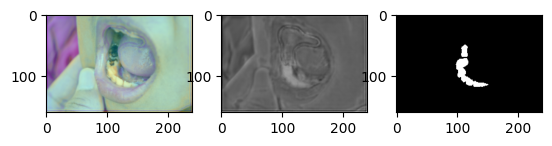

Ineference Time :  0.17436049999969327


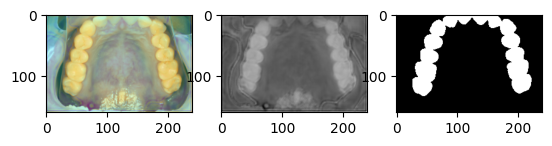

Ineference Time :  0.17094560000032288


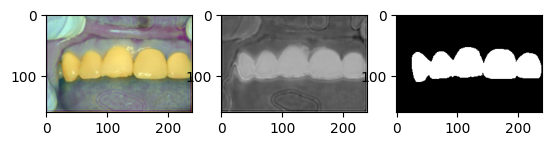

Ineference Time :  0.18419929999981832


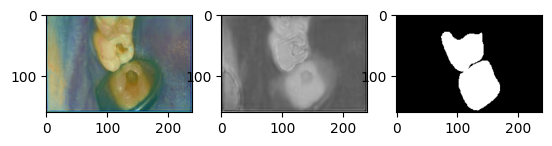

Ineference Time :  0.16118539999979475


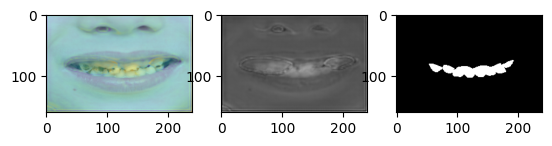

Ineference Time :  0.17851939999991373


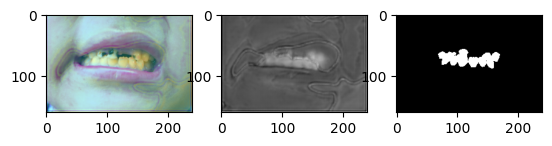

Ineference Time :  0.18231110000033368


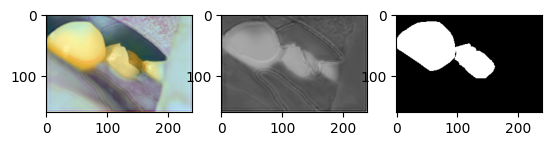

Ineference Time :  0.18462100000033388


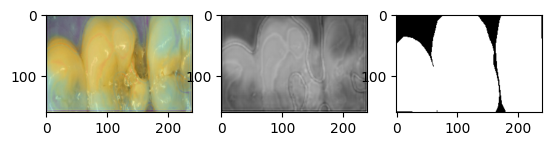

Ineference Time :  0.16490469999962443


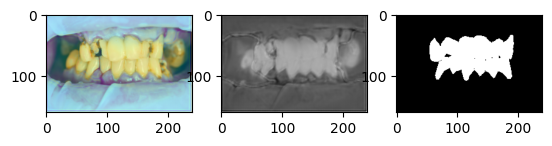

Ineference Time :  0.1666307999998935


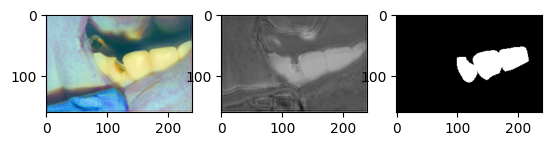

Ineference Time :  0.16817519999995056


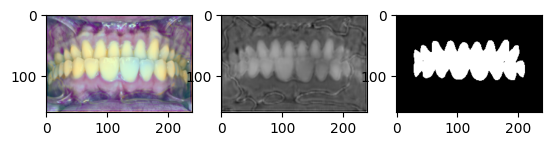

Ineference Time :  0.16097549999994953


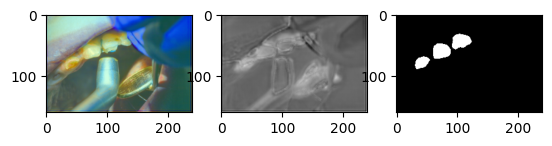

Ineference Time :  0.17075819999990927


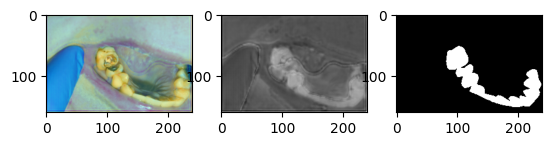

Ineference Time :  0.1772624000000178


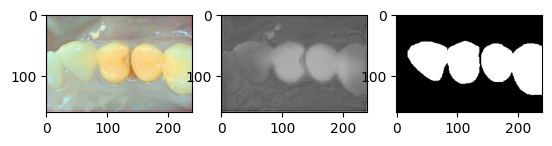

Ineference Time :  0.16071540000029927


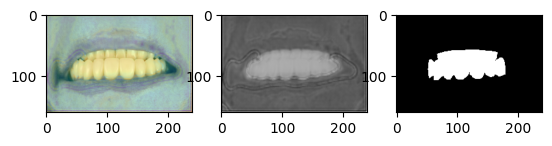

Ineference Time :  0.17051130000027115


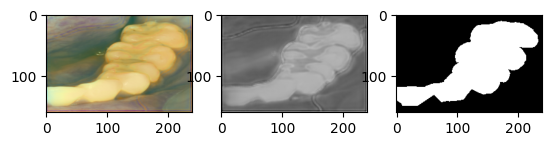

Ineference Time :  0.17933380000022225


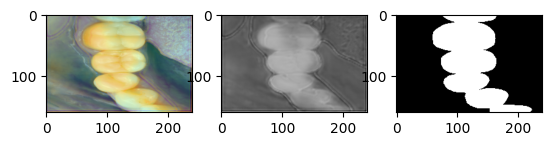

Ineference Time :  0.1697439999998096


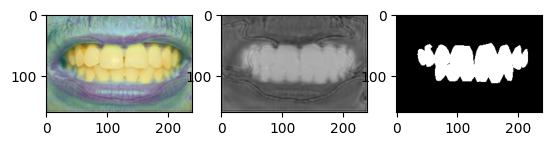

Ineference Time :  0.18438770000011573


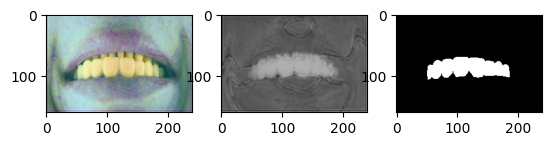

Ineference Time :  0.17576099999996586


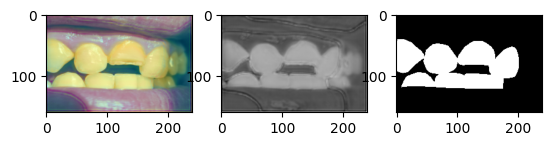

Ineference Time :  0.1722647000001416


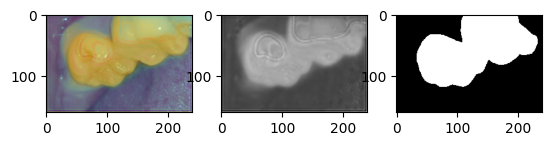

Ineference Time :  0.17193730000008145


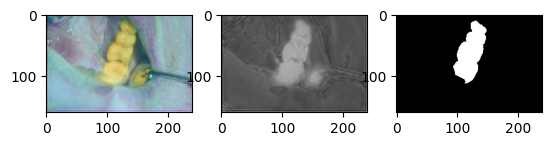

In [5]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import timeit

with open("model_weights20.pth", 'rb') as file:
    weights = torch.load(file)
    model = UNET()
    model.load_state_dict(weights)


for img, mask in test_data:
    model.eval()
    with torch.inference_mode():
        t1 = timeit.default_timer()
        
        output = model(img.unsqueeze(0))

        t2 = timeit.default_timer()
        dt = t2-t1
        print("Ineference Time : ",  dt)

        plt.subplot(1, 3, 1)
        plt.imshow(img.permute(1, 2, 0))
        plt.imshow(output.squeeze(), cmap='jet', alpha=0.3)

        plt.subplot(1, 3, 2)
        plt.imshow(output.squeeze(), cmap=plt.cm.gray)

        plt.subplot(1, 3, 3)
        plt.imshow(mask.squeeze(), cmap=plt.cm.gray)
        plt.show()